# USGS Landsat 8 Level 2, Collection 2, Tier 2. 

- https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LC08_C02_T2_L2

<br>

- This dataset contains atmospherically corrected surface reflectance and land surface temperature derived from the data produced by the Landsat 8 OLI/TIRS sensors. These images contain 5 visible and near-infrared (VNIR) bands and 2 short-wave infrared (SWIR) bands processed to orthorectified surface reflectance, and one thermal infrared (TIR) band processed to orthorectified surface temperature. They also contain intermediate bands used in calculation of the ST products, as well as QA bands. <br><br>

- Landsat 8 SR products are created with the Land Surface Reflectance Code (LaSRC). All Collection 2 ST products are created with a single-channel algorithm jointly created by the Rochester Institute of Technology (RIT) and National Aeronautics and Space Administration (NASA) Jet Propulsion Laboratory (JPL). <br><br>

- Strips of collected data are packaged into overlapping "scenes" covering approximately 170km x 183km using a standardized reference grid. <br><br>

- Some assets have only SR data, in which case ST bands are present but empty. For assets with both ST and SR bands, 'PROCESSING_LEVEL' is set to 'L2SP'. For assets with only SR bands, 'PROCESSING_LEVEL' is set to 'L2SR'. <br><br>

In [1]:
import os
import glob
import numpy as np

import matplotlib.pyplot as plt
plt.style.use("default") 
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patches as mpatches
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import pandas as pd

import geopandas as gpd

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from shapely.geometry import Point, LineString, Polygon, mapping

import rasterio
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.features import geometry_mask
from rasterio.merge import merge
from rasterio.enums import Resampling
from rasterio.plot import plotting_extent
from rasterio.crs import CRS
from rasterio.io import MemoryFile
import tempfile

In [2]:
# Working Directory
os.chdir('J:\Chomiak_Python\Chomiak_Notebooks\Maps_NA_TX_Data')
# Shapes
tx = gpd.read_file('Texas_State_Boundary')
tx_co = gpd.read_file('Texas_County_Boundaries_Detailed')
tx_watershed = gpd.read_file('tx_watershed')
Counties_1 = gpd.read_file('Counties_1')
Counties_1_Merged = gpd.read_file('Counties_1_Merged')
HUCs = gpd.read_file('Hockly_HUCs')

# Watershed Boundaries
huc8 = "J:///Chomiak_Python/Chomiak_Notebooks/Maps_NA_TX_Data/USGS_HUC_8_Shapefile.zip"    # HUC8
huc8 = gpd.read_file(huc8)    # HUC8
huc8.crs = CRS.from_epsg(4326)       # Change the CRS of the File (Previously 4269)

gbsl4 = huc8[huc8['HUC_8'] == '12040204']

# Attribute File
df = pd.read_csv('NLCD_2019_Attribute_Tables.csv')
# Extract colors from table
colors = df['Color'].tolist()
# Create the colormap
cmap = plt.matplotlib.colors.ListedColormap(colors)
norm = plt.matplotlib.colors.BoundaryNorm(df['Value'].tolist(), cmap.N)

# Define the coordinates
coords = (29.313192, -94.816989)

# Create a Point geometry
geometry = [Point(coords[::-1])]  # Note: Point takes in (x, y) so we reverse the tuple
# Create a GeoDataFrame
sample_location = gpd.GeoDataFrame({'geometry': geometry}, crs="EPSG:4326")

# Reproject the shapefile to match the raster's CRS
raster_crs = 'PROJCS["WGS_1984_Albers",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",23],PARAMETER["longitude_of_center",-96],PARAMETER["standard_parallel_1",29.5],PARAMETER["standard_parallel_2",45.5],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'
sample_location_reprojected = sample_location.to_crs(raster_crs)

# Define the buffer distance (half of 5km for each side)
buffer_distance = 10000 / 2

# Create the buffer around the point and then get its bounding rectangle
bounding_box = sample_location_reprojected.buffer(buffer_distance).envelope

# Sample Box
bounding_box_gtx_4326 = gpd.read_file('bounding_box_gtx_4326')

In [3]:
bounding_box_4326 = bounding_box.to_crs(4326)

<AxesSubplot:>

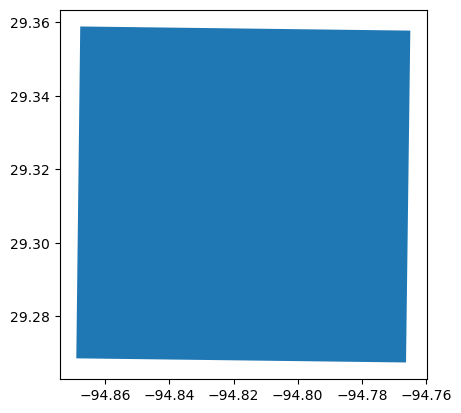

In [4]:
bounding_box_4326.plot()

In [5]:
# Sample Box
#bounding_box_gtx_4326 = gpd.read_file('bounding_box_gtx_4326')

<AxesSubplot:title={'center':'West Galveston Bay Watershed'}, xlabel='Longitude', ylabel='Latitude'>

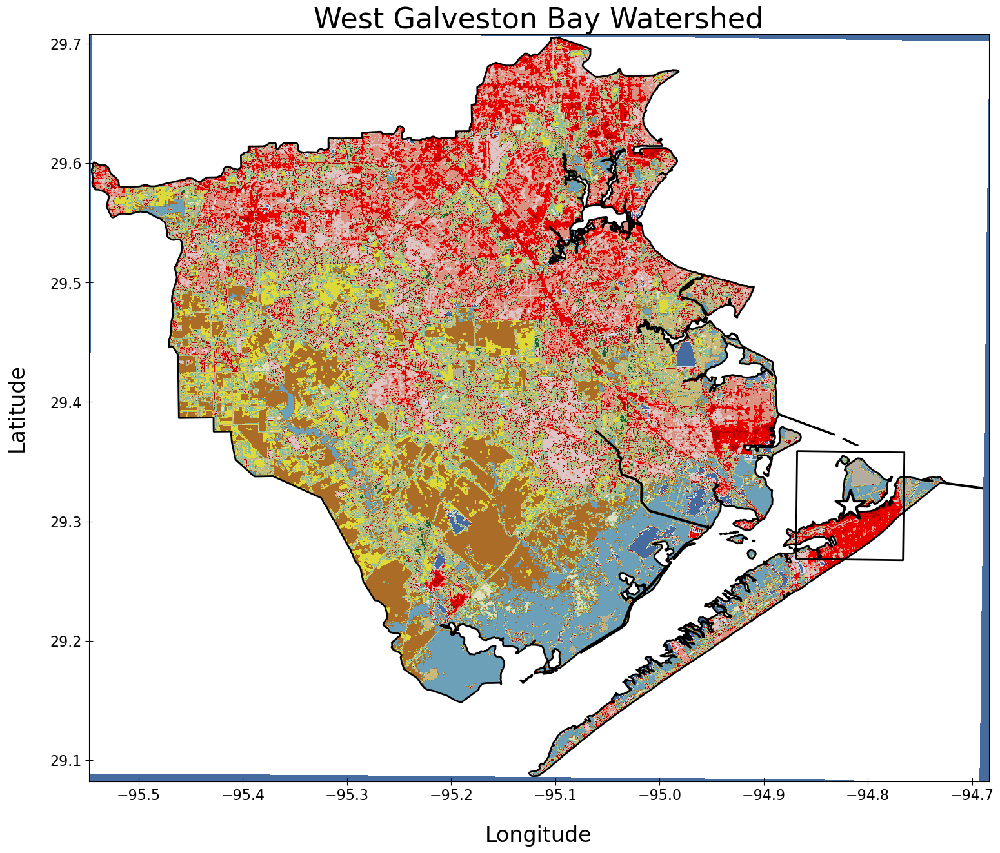

In [6]:
# Open the raster
with rasterio.open("NLCD_2019_GTX_Sample_West_Galveston_Bay_4326.tif") as src:
    # Read the data
    data = src.read(1)
    # Get the raster's bounds
    raster_extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    # Create a masked array where the nodata values are masked out
    masked_array = np.ma.masked_where(data == src.nodata, data)
    
# Create a figure and axis
fig, ax = plt.subplots(figsize=(18, 18))

# Display the raster using the raster_extent
img = ax.imshow(masked_array, cmap=cmap, norm=norm, extent=raster_extent) # cmap=cmap, norm=norm, 

# Set title and labels
ax.set_title('West Galveston Bay Watershed', fontsize=32)
ax.set_xlabel('Longitude', color='black', fontsize=24, labelpad=25)
ax.set_ylabel('Latitude', color='black', fontsize=24, labelpad=25)
ax.xaxis.set_tick_params(which='major', direction='inout', length=8, labelsize=16)
ax.yaxis.set_tick_params(which='major', direction='inout', length=8, labelsize=16)

# Shapes
#sample_location_reprojected.plot(ax=ax, color='white', edgecolor='black', marker='*', markersize=1200, lw=3, zorder=6)
gbsl4.plot(ax=ax, color='none', edgecolor='black', lw=2)
#HydroRIVERS_TX_SJRB_Spring_reprojected.plot(ax=ax, column='ORD_FLOW', color='darkblue', lw=4, zorder=3, label='10$^1$ - 10$^2$ [m$^3$/s]')
sample_location.plot(ax=ax, color='white', edgecolor='black', marker='*', markersize=1200, lw=3, zorder=6)
bounding_box_gtx_4326.plot(ax=ax, color='none', edgecolor='black', lw=2)

#fig.savefig("Chomiak_TX_Images_2023\2019_NLCD_GBSL_WGB_1_4326.png", dpi=800, bbox_inches='tight')
# Close the figure without displaying it
#plt.close(fig)

In [7]:
#gbsl4.to_file('gbsl4')

<br><br><br>

# Box for Clip for Ocean Basemap

<br><br><br>

In [8]:
from shapely.geometry import box

# Open the raster
with rasterio.open("NLCD_2019_GTX_Sample_1_4326.tif") as src:
    # Get the raster's bounds
    bounds = src.bounds

# Create a rectangle from the bounds
rectangle = box(bounds.left, bounds.bottom, bounds.right, bounds.top)

# Create a GeoDataFrame
box_wgb = gpd.GeoDataFrame({'geometry': [rectangle]}, crs=src.crs)

#box_wgb.to_file("box_wgb_4326")

<AxesSubplot:>

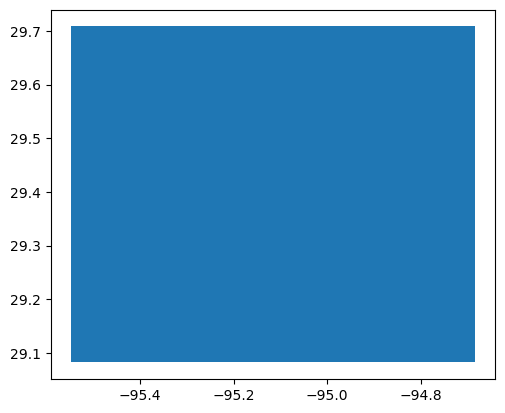

In [9]:
box_wgb.plot()

<br><br><br>

# GEE

<br><br><br>

I need you to respond as an expert geospatial analyst. You are an expert in the use of Rasterio, Numpy, Geopandas, pandas, and Matplotlib for geospatial analysis. You are also an expert in Google Earth Engine. You will respond as an academic with a professional tone. You will be tasked with helping me code and interpreting geospatial imagery. 

Let me explain the data first. I am using data from the USGS Landsat 8 Level 2, Collection 2, Tier 2. This dataset contains atmospherically corrected surface reflectance and land surface temperature derived from the data produced by the Landsat 8 OLI/TIRS sensors. These images contain 5 visible and near-infrared (VNIR) bands and 2 short-wave infrared (SWIR) bands processed to orthorectified surface reflectance, and one thermal infrared (TIR) band processed to orthorectified surface temperature. They also contain intermediate bands used in calculation of the ST products, as well as QA bands.

Collection 2 Surface Reflectance Enhancements
 	Collection 2 Surface Reflectance	Collection 1 Surface Reflectance
(on demand, U.S. ARD)
Fill Value	0	-9999
Scaling Factor	0.0000275 + -0.2	0.0001
Data Type	Unsigned 16 bit integer	Signed 16 bit integer
Valid Range	1-65455	0-10000
Quality Band	L1 QA_Pixel
L1 QA_RADSAT
L2 SR_QA_AEROSOL	Level-2 PIXELQA
Level-2 RADSATQA
Level-2 SRAEROSOLQA
Visit the Landsat Collection 2 Surface Reflectance webpage for additional information and documentation.

Surface Temperature
Surface Temperature measures the Earth’s surface temperature (units Kelvin) and is an important geophysical parameter in global energy balance studies and hydrologic modeling. Surface temperature is also useful for monitoring crop and vegetation health, and extreme heat events such as natural disasters (e.g., volcanic eruptions, wildfires), and urban heat island effects.

Note: A surface temperature product cannot be generated if auxiliary data is missing.  Please refer to the Atmospheric Auxiliary Data and Constraints and Caveats sections on Landsat Collection 2 Surface Temperature for more specifics about the required data needed in order to create an surface temperature product. 

Collection 2 Surface Temperature Enhancements
 	Collection 2 Surface Temperature	Collection 1 Surface Temperature
(on demand, U.S. ARD)
Fill Value	0	-9999
Scaling Factor	0.00341802 + 149.0	0.1
Data Type	Unsigned 16-bit integer	Signed 16-bit integer
Valid Range	1-65535	1500-3730
Atmospheric
Reanalysis Source	GEOS-5 FP-IT (2000-present)
MERRA-2 (1982-1999)	NARR
Quality Band	L1 QA_Pixel
L1 QA_RADSAT
L2 SR_QA_AEROSOL	Level-2 PIXELQA
Level-2 RADSATQA
Level-2 SRAEROSOLQA
Visit the Landsat Collection 2 Surface Temperature webpage for additional information and documentation.

Here is a table description of the bands.

Name	Units	Min	Max	Scale	Offset	Wavelength	Description
SR_B1		1	65455	2.75e-05	-0.2	0.435-0.451 μm	
Band 1 (ultra blue, coastal aerosol) surface reflectance

SR_B2		1	65455	2.75e-05	-0.2	0.452-0.512 μm	
Band 2 (blue) surface reflectance

SR_B3		1	65455	2.75e-05	-0.2	0.533-0.590 μm	
Band 3 (green) surface reflectance

SR_B4		1	65455	2.75e-05	-0.2	0.636-0.673 μm	
Band 4 (red) surface reflectance

SR_B5		1	65455	2.75e-05	-0.2	0.851-0.879 μm	
Band 5 (near infrared) surface reflectance

SR_B6		1	65455	2.75e-05	-0.2	1.566-1.651 μm	
Band 6 (shortwave infrared 1) surface reflectance

SR_B7		1	65455	2.75e-05	-0.2	2.107-2.294 μm	
Band 7 (shortwave infrared 2) surface reflectance

SR_QA_AEROSOL							
Aerosol attributes
#############################
The table you've provided details the spectral bands of the Landsat 8 satellite's Operational Land Imager (OLI) and their respective surface reflectance scales and wavelengths. The surface reflectance values in these bands have been scaled by a factor of 0.0000275 and an offset of -0.2. This is done to store the data in an efficient format while maintaining precision.

To convert the scaled digital numbers (DNs) in your dataset back to reflectance values, you would apply the following formula:

Reflectance
=
(
DN
×
Scale
)
+
Offset
Reflectance=(DN×Scale)+Offset

Here's what each band is commonly used for:

SR_B1 (Ultra Blue): Useful for coastal and aerosol studies.
SR_B2 (Blue): Important for water penetration and can help with soil/vegetation differentiation.
SR_B3 (Green): Reflects peak chlorophyll absorption, good for analyzing plant health.
SR_B4 (Red): Indicates vegetation vigor with chlorophyll absorption.
SR_B5 (Near Infrared - NIR): Indicates biomass content and shorelines, and penetrates water surfaces.
SR_B6 (SWIR 1): Can detect moisture content of soil and vegetation; useful in crop stress analysis.
SR_B7 (SWIR 2): Helps with vegetation discrimination and soil moisture.
The SR_QA_AEROSOL band provides quality assessment information specifically related to aerosols, which can impact the surface reflectance measurements and interpretations.

#############################

Bitmask for SR_QA_AEROSOL

Bit 0: Fill
Bit 1: Aerosol retrieval - valid
Bit 2: Water pixel
Bit 3: Unused
Bit 4: Unused
Bit 5: Interpolated Aerosol
Bits 6-7: Aerosol Level
0: Climatology
1: Low
2: Medium
3: High

Here is some more band information.

ST_B10	K	0	65535	0.00341802	149	10.60-11.19 μm	
Band 10 surface temperature. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

ST_ATRAN		0	10000	0.0001			
Atmospheric Transmittance. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

ST_CDIST	km	0	24000	0.01			
Pixel distance to cloud. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

ST_DRAD	W/(m^2*sr*um)/ DN	0	28000	0.001			
Downwelled Radiance. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

ST_EMIS		0	10000	0.0001			
Emissivity of Band 10 estimated from ASTER GED. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

ST_EMSD		0	10000	0.0001			
Emissivity standard deviation. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

ST_QA	K	0	32767	0.01			
Uncertainty of the Surface Temperature band. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

ST_TRAD	W/(m^2*sr*um)/ DN	0	22000	0.001			
Thermal band converted to radiance. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

ST_URAD	W/(m^2*sr*um)/ DN	0	28000	0.001			
Upwelled Radiance. If 'PROCESSING_LEVEL' is set to 'L2SR', this band is fully masked out.

QA_PIXEL							
Pixel quality attributes generated from the CFMASK algorithm.

Here is more band information.

Bitmask for QA_PIXEL

Bit 0: Fill
Bit 1: Dilated Cloud
Bit 2: Cirrus (high confidence)
Bit 3: Cloud
Bit 4: Cloud Shadow
Bit 5: Snow
Bit 6: Clear
0: Cloud or Dilated Cloud bits are set
1: Cloud and Dilated Cloud bits are not set
Bit 7: Water
Bits 8-9: Cloud Confidence
0: None
1: Low
2: Medium
3: High
Bits 10-11: Cloud Shadow Confidence
0: None
1: Low
2: Medium
3: High
Bits 12-13: Snow/Ice Confidence
0: None
1: Low
2: Medium
3: High
Bits 14-15: Cirrus Confidence
0: None
1: Low
2: Medium
3: High




# Code 1

In [10]:
os.getcwd()

'J:\\Chomiak_Python\\Chomiak_Notebooks\\Maps_NA_TX_Data'

In [11]:
ls8 = 'Landsat8_RGB_composite.tif'

In [12]:
with rasterio.open(ls8) as src:
    wtx_meta = src.meta

wtx_meta

{'driver': 'GTiff',
 'dtype': 'float32',
 'nodata': None,
 'width': 3207,
 'height': 2324,
 'count': 3,
 'crs': CRS.from_epsg(4326),
 'transform': Affine(0.00026949458523585647, 0.0, -95.54795772244674,
        0.0, -0.00026949458523585647, 29.70827459264511)}

In [13]:
# Open the raster file
with rasterio.open(ls8) as src:
    # Read the entire array
    raster_data = src.read()
    # Metadata inspection
    profile = src.profile
    
profile

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 3207, 'height': 2324, 'count': 3, 'crs': CRS.from_epsg(4326), 'transform': Affine(0.00026949458523585647, 0.0, -95.54795772244674,
       0.0, -0.00026949458523585647, 29.70827459264511), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'lzw', 'interleave': 'pixel'}

In [14]:
# Open the raster file
with rasterio.open(ls8) as src:
    # Read the entire array
    raster_data = src.read()
    # Compute statistics
    stats = []
    for band in raster_data:
        stats.append({
            'min': band.min(),
            'max': band.max(),
            'mean': band.mean(),
            'std': band.std()
        })

stats

[{'min': nan, 'max': nan, 'mean': nan, 'std': nan},
 {'min': nan, 'max': nan, 'mean': nan, 'std': nan},
 {'min': nan, 'max': nan, 'mean': nan, 'std': nan}]

In [15]:
# Open the raster file
with rasterio.open(ls8) as src:
    # Read the entire array
    raster_data = src.read()
    # Check for NoData values
    nodata = src.nodatavals

nodata

(None, None, None)

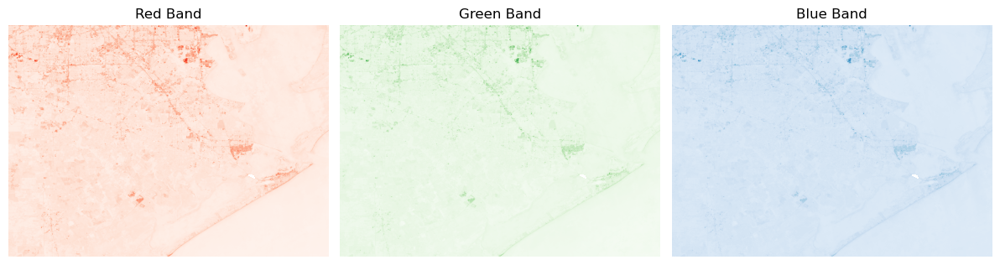

In [16]:
def plot_bands(img_path):
    # Open the image with rasterio
    with rasterio.open(img_path) as dataset:
        
        # Read the bands 
        # SR_B4 (Red), SR_B3 (Green), 'SR_B2 (Blue)
        bands = dataset.read([1, 2, 3])
    
    # Set up the figure and axes
    fig, axs = plt.subplots(1,3, figsize=(12, 6))
    
    band_names = ['Red', 'Green', 'Blue']
    cmaps = ['Reds', 'Greens', 'Blues']
    
    for ax, band, name, cmap in zip(axs, bands, band_names, cmaps):
        # Assuming 10000 is the maximum possible value in the uint16 Landsat data, adjust if different
        max_val = 10000.0
        ax.imshow(np.clip(band / max_val, 0, 1), cmap=cmap)  # normalized to 0-1 for visualization
        ax.set_title(f"{name} Band")
        ax.axis('off')
    
    plt.tight_layout()
    fig.tight_layout(pad=1)
    plt.show()

# Call the function
plot_bands(ls8)

In [17]:
with rasterio.open(ls8) as src:
    band_red_dn = src.read(1)
    band_green_dn = src.read(2)
    band_blue_dn = src.read(3)
    print('Red band DN range:', np.nanmin(band_red_dn), '-', np.nanmax(band_red_dn))
    print('Green band DN range:', np.nanmin(band_green_dn), '-', np.nanmax(band_green_dn))
    print('Blue band DN range:', np.nanmin(band_blue_dn), '-', np.nanmax(band_blue_dn))


Red band DN range: 0.6967 - 3.5732
Green band DN range: 0.7543 - 3.4378
Blue band DN range: 0.4326 - 3.0982


In [18]:
# DN ranges provided
dn_ranges = {
    'red': (0.6967, 3.5732),
    'green': (0.7543, 3.4378),
    'blue': (0.4326, 3.0982)
}

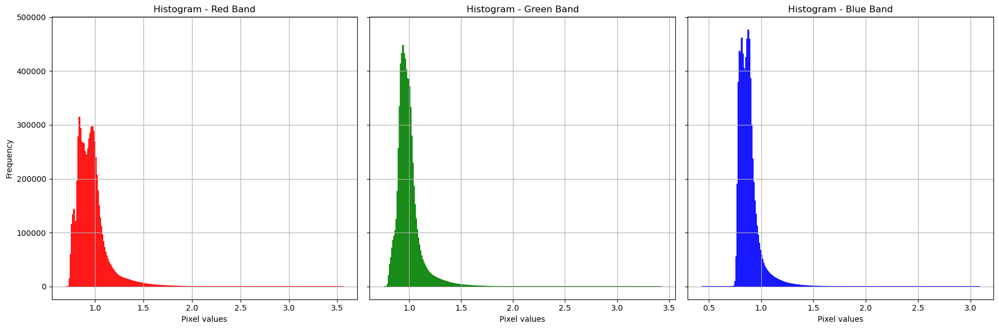

In [19]:
# Modify the function to plot shaded histogram for each band in respective colors, excluding NaN values
def plot_shaded_histogram(band, title, ax, color):
    # Flatten the band and remove NaN values for histogram calculation
    flattened_band = band.flatten()
    valid_data = flattened_band[~np.isnan(flattened_band)]
    
    # Calculate histogram
    hist, bins = np.histogram(valid_data, bins=256, range=(valid_data.min(), valid_data.max()))
    
    # Plot shaded histogram on the provided axes object with respective color
    ax.fill_between(bins[:-1], hist, step="pre", alpha=0.9, color=color)
    ax.set_title(f'Histogram - {title}')
    ax.set_xlabel('Pixel values')
    ax.grid(True)

# Create subplots in 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Plot shaded histograms for each band on the respective axes with corresponding colors
plot_shaded_histogram(band_red_dn, 'Red Band', axes[0], 'red')
plot_shaded_histogram(band_green_dn, 'Green Band', axes[1], 'green')
plot_shaded_histogram(band_blue_dn, 'Blue Band', axes[2], 'blue')

axes[0].set_ylabel('Frequency')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


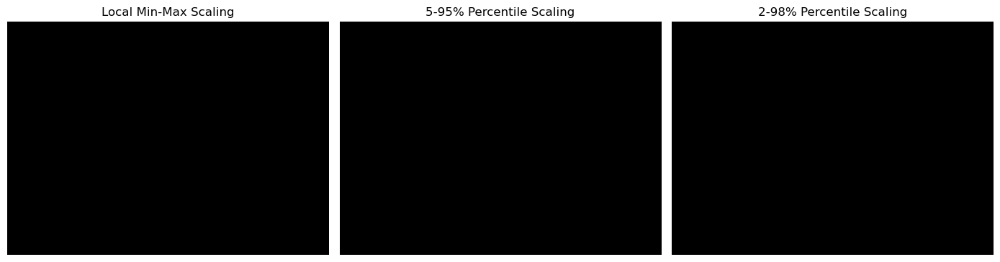

In [20]:
# Read Bands
with rasterio.open(ls8) as dataset:
    
    # Read the bands 
    red, green, blue = dataset.read([1, 2, 3])
    
    #Display Metadata
    dataset.profile
    
    # Method 1: Actual min and max
red_rescaled_1 = np.clip((red - red.min()) / (red.max() - red.min()), 0, 1)
green_rescaled_1 = np.clip((green - green.min()) / (green.max() - green.min()), 0, 1)
blue_rescaled_1 = np.clip((blue - blue.min()) / (blue.max() - blue.min()), 0, 1)
natural_color_1 = np.dstack((red_rescaled_1, green_rescaled_1, blue_rescaled_1))

# Method 2: 5th and 95th percentiles
vmin_red = np.percentile(red, 5)
vmax_red = np.percentile(red, 95)
vmin_green = np.percentile(green, 5)
vmax_green = np.percentile(green, 95)
vmin_blue = np.percentile(blue, 5)
vmax_blue = np.percentile(blue, 95)
red_rescaled_2 = np.clip((red - vmin_red) / (vmax_red - vmin_red), 0, 1)
green_rescaled_2 = np.clip((green - vmin_green) / (vmax_green - vmin_green), 0, 1)
blue_rescaled_2 = np.clip((blue - vmin_blue) / (vmax_blue - vmin_blue), 0, 1)
natural_color_2 = np.dstack((red_rescaled_2, green_rescaled_2, blue_rescaled_2))

# Method 3: 2nd and 98th percentiles
vmin_red_3 = np.percentile(red, 2)
vmax_red_3 = np.percentile(red, 98)
vmin_green_3 = np.percentile(green, 2)
vmax_green_3 = np.percentile(green, 98)
vmin_blue_3 = np.percentile(blue, 2)
vmax_blue_3 = np.percentile(blue, 98)
red_rescaled_3 = np.clip((red - vmin_red_3) / (vmax_red_3 - vmin_red_3), 0, 1)
green_rescaled_3 = np.clip((green - vmin_green_3) / (vmax_green_3 - vmin_green_3), 0, 1)
blue_rescaled_3 = np.clip((blue - vmin_blue_3) / (vmax_blue_3 - vmin_blue_3), 0, 1)
natural_color_3 = np.dstack((red_rescaled_3, green_rescaled_3, blue_rescaled_3))

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(14,6))

# Method 1 Plot
axs[0].imshow(natural_color_1)
axs[0].set_title('Local Min-Max Scaling')
axs[0].axis('off')

# Method 2 Plot
axs[1].imshow(natural_color_2)
axs[1].set_title('5-95% Percentile Scaling')
axs[1].axis('off')

# Method 4 Plot
axs[2].imshow(natural_color_2)
axs[2].set_title('2-98% Percentile Scaling')
axs[2].axis('off')

plt.tight_layout()
plt.show()

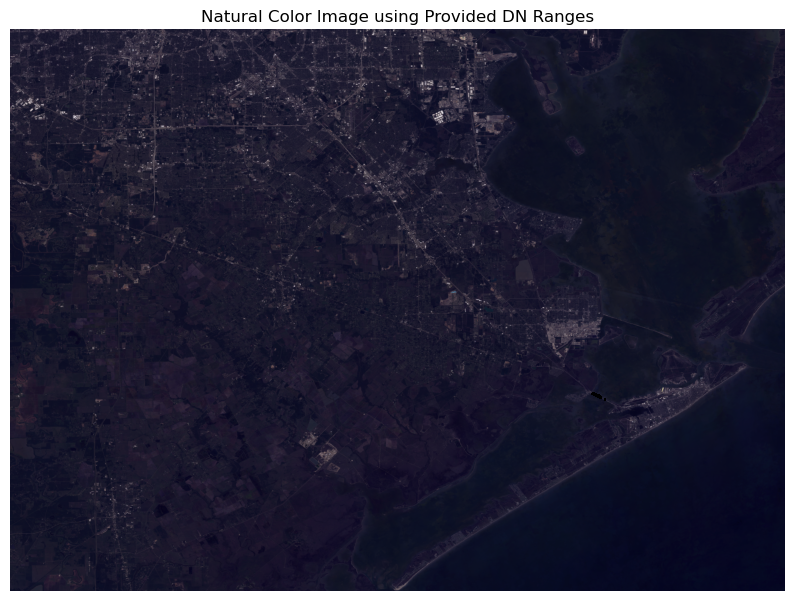

In [21]:
# Normalize the bands
def normalize_band(band, dn_min, dn_max):
    # Rescale the band data to reflect 0-1 range based on the given DN range
    return np.clip((band - dn_min) / (dn_max - dn_min), 0, 1)

# Apply the normalization using the DN ranges
red_normalized = normalize_band(red, *dn_ranges['red'])
green_normalized = normalize_band(green, *dn_ranges['green'])
blue_normalized = normalize_band(blue, *dn_ranges['blue'])

# Combine the bands into a natural color image
natural_color = np.dstack((red_normalized, green_normalized, blue_normalized))

# Plot the image
plt.figure(figsize=(10, 10))
plt.imshow(natural_color)
plt.title('Natural Color Image using Provided DN Ranges')
plt.axis('off')
plt.show()


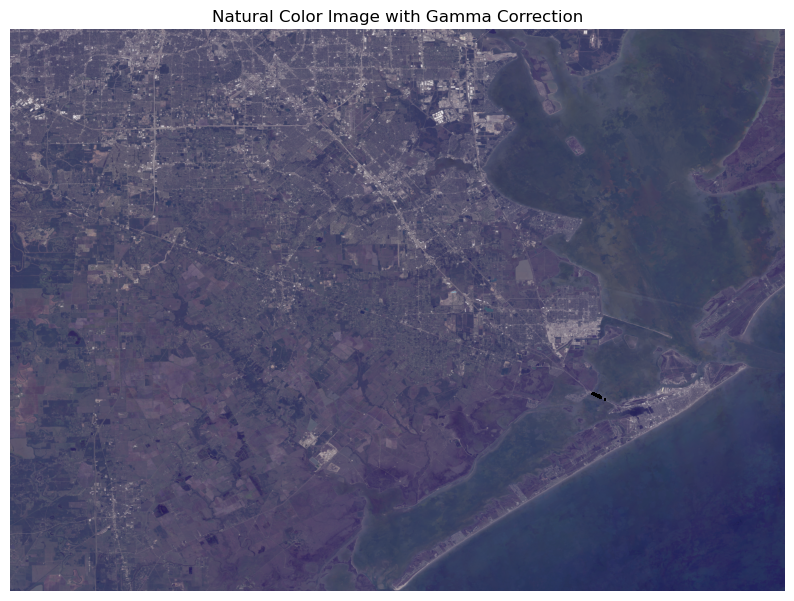

In [22]:
# Normalization of bands might need adjustment, but for now let's apply gamma correction
def apply_gamma_correction(band, gamma=0.5):
    # Apply gamma correction to each band
    return np.power(band, gamma)

# Apply gamma correction to each band
gamma_corrected_red = apply_gamma_correction(red_normalized)
gamma_corrected_green = apply_gamma_correction(green_normalized)
gamma_corrected_blue = apply_gamma_correction(blue_normalized)

# Stack the gamma-corrected bands
gamma_corrected_image = np.dstack((gamma_corrected_red, gamma_corrected_green, gamma_corrected_blue))

# Plot the gamma-corrected image
plt.figure(figsize=(10, 10))
plt.imshow(gamma_corrected_image)
plt.title('Natural Color Image with Gamma Correction')
plt.axis('off')
plt.show()

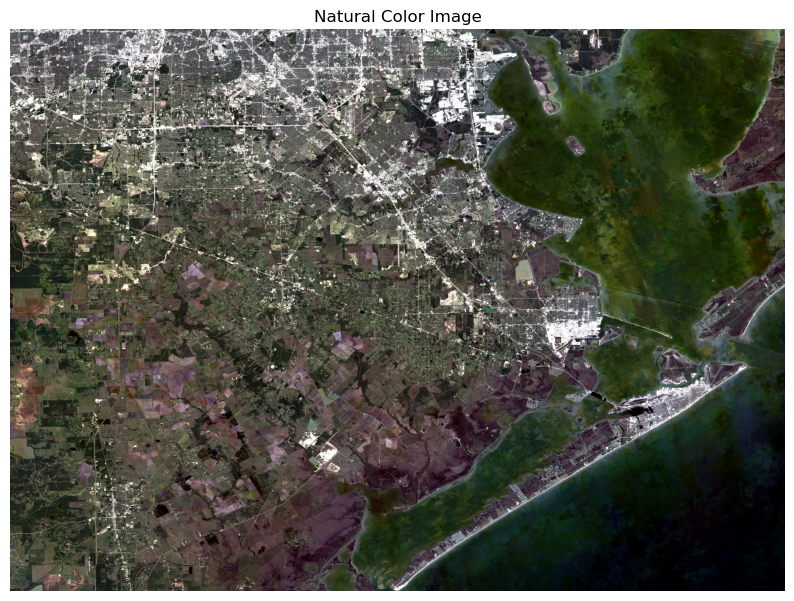

In [23]:
# Landsat 8 scaling factors and offsets
scale_factor = 0.0000275
offset = -0.2

def convert_dn_to_reflectance(dn):
    return dn * scale_factor + offset

with rasterio.open(ls8) as src:
    band_red_dn = src.read(1).astype('float64')
    band_green_dn = src.read(2).astype('float64')
    band_blue_dn = src.read(3).astype('float64')

# Convert digital numbers to reflectance
band_red_reflectance = convert_dn_to_reflectance(band_red_dn)
band_green_reflectance = convert_dn_to_reflectance(band_green_dn)
band_blue_reflectance = convert_dn_to_reflectance(band_blue_dn)

# Calculate min and max reflectance values for normalization
red_min, red_max = np.nanpercentile(band_red_reflectance, (2, 98))  # Using percentile to avoid extreme values
green_min, green_max = np.nanpercentile(band_green_reflectance, (2, 98))
blue_min, blue_max = np.nanpercentile(band_blue_reflectance, (2, 98))

# Normalize the bands
red_normalized = (band_red_reflectance - red_min) / (red_max - red_min)
green_normalized = (band_green_reflectance - green_min) / (green_max - green_min)
blue_normalized = (band_blue_reflectance - blue_min) / (blue_max - blue_min)

# Clip values to 0-1 range
red_normalized = np.clip(red_normalized, 0, 1)
green_normalized = np.clip(green_normalized, 0, 1)
blue_normalized = np.clip(blue_normalized, 0, 1)

# Combine the normalized bands
natural_color = np.dstack((red_normalized, green_normalized, blue_normalized))

# Plot the gamma-corrected image
plt.figure(figsize=(10, 10))
plt.imshow(natural_color)
plt.title('Natural Color Image')
plt.axis('off')
plt.show()

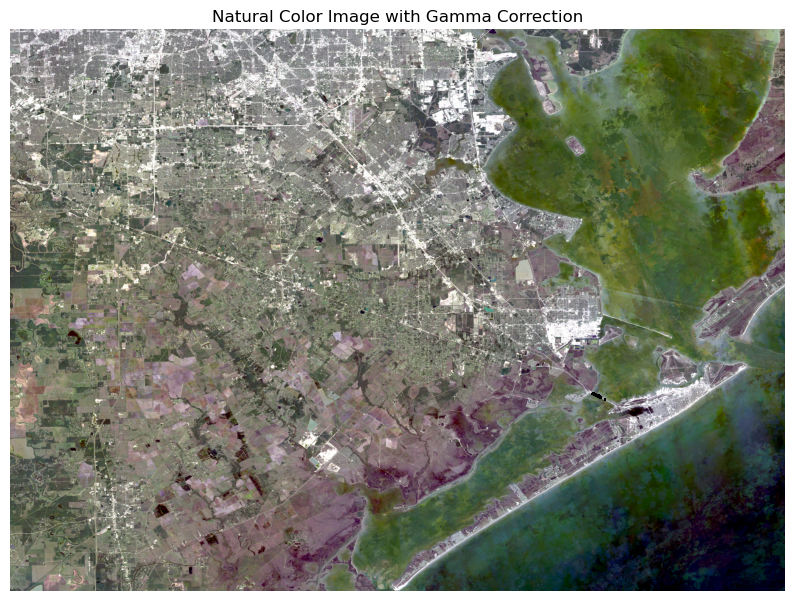

In [24]:
# Landsat 8 scaling factors and offsets
scale_factor = 0.0000275
offset = -0.2

def convert_dn_to_reflectance(dn):
    return dn * scale_factor + offset

with rasterio.open(ls8) as src:
    band_red_dn = src.read(1).astype('float64')
    band_green_dn = src.read(2).astype('float64')
    band_blue_dn = src.read(3).astype('float64')

# Convert digital numbers to reflectance
band_red_reflectance = convert_dn_to_reflectance(band_red_dn)
band_green_reflectance = convert_dn_to_reflectance(band_green_dn)
band_blue_reflectance = convert_dn_to_reflectance(band_blue_dn)

# Calculate min and max reflectance values for normalization
red_min, red_max = np.nanpercentile(band_red_reflectance, (2, 98))  # Using percentile to avoid extreme values
green_min, green_max = np.nanpercentile(band_green_reflectance, (2, 98))
blue_min, blue_max = np.nanpercentile(band_blue_reflectance, (2, 98))

# Normalize the bands
red_normalized = (band_red_reflectance - red_min) / (red_max - red_min)
green_normalized = (band_green_reflectance - green_min) / (green_max - green_min)
blue_normalized = (band_blue_reflectance - blue_min) / (blue_max - blue_min)

# Clip values to 0-1 range
red_normalized = np.clip(red_normalized, 0, 1)
green_normalized = np.clip(green_normalized, 0, 1)
blue_normalized = np.clip(blue_normalized, 0, 1)

# Combine the normalized bands
natural_color = np.dstack((red_normalized, green_normalized, blue_normalized))

# Apply gamma correction
gamma = 0.6 # Adjust gamma based on visual assessment
gamma_corrected_image = np.power(natural_color, gamma)

# Plot the gamma-corrected image
plt.figure(figsize=(10, 10))
plt.imshow(gamma_corrected_image)
plt.title('Natural Color Image with Gamma Correction')
plt.axis('off')
plt.show()

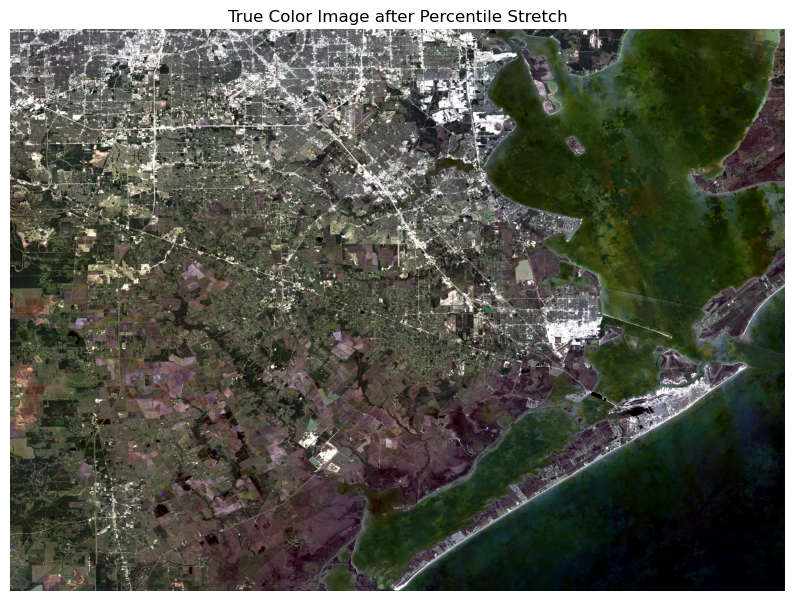

In [25]:
# Function to perform a percentile-based contrast stretch
def percentile_stretch(band, lower_percentile=2, upper_percentile=98):
    # Calculate the lower and upper percentile values
    lower, upper = np.nanpercentile(band, [lower_percentile, upper_percentile])
    # Apply the stretch
    stretched_band = np.clip((band - lower) / (upper - lower), 0, 1)
    return stretched_band

# Apply percentile stretch to each band
band_red_stretch = percentile_stretch(band_red_dn)
band_green_stretch = percentile_stretch(band_green_dn)
band_blue_stretch = percentile_stretch(band_blue_dn)

# Stack bands for RGB image after percentile stretch
rgb_percentile_stretch = np.dstack((band_red_stretch, band_green_stretch, band_blue_stretch))

# Plot the RGB composite image after percentile stretch
plt.figure(figsize=(10, 10))
plt.imshow(rgb_percentile_stretch)
plt.title('True Color Image after Percentile Stretch')
plt.axis('off')  # Hide axis
plt.show()


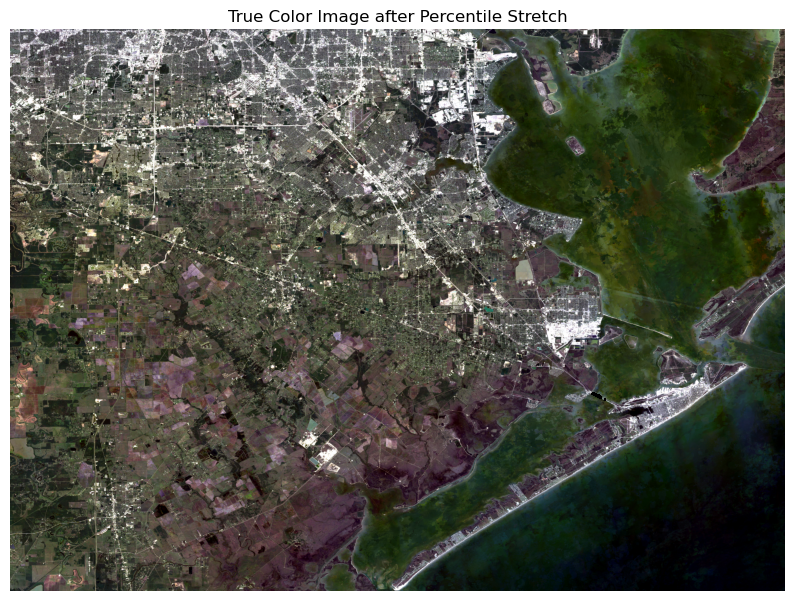

In [26]:
# Function to perform a percentile-based contrast stretch
def percentile_stretch(band, lower_percentile=2, upper_percentile=98):
    # Calculate the lower and upper percentile values
    lower, upper = np.nanpercentile(band, [lower_percentile, upper_percentile])
    # Apply the stretch
    stretched_band = np.clip((band - lower) / (upper - lower), 0, 1)
    return stretched_band

# Open the raster file
with rasterio.open(ls8) as src:
    band_red_dn = src.read(1)
    band_green_dn = src.read(2)
    band_blue_dn = src.read(3)
    # Get the profile for writing the output
    profile = src.profile

# Apply percentile stretch to each band
band_red_stretch = percentile_stretch(band_red_dn)
band_green_stretch = percentile_stretch(band_green_dn)
band_blue_stretch = percentile_stretch(band_blue_dn)

# Stack bands for RGB image after percentile stretch
rgb_percentile_stretch = np.dstack((band_red_stretch, band_green_stretch, band_blue_stretch))

# Plot the RGB composite image after percentile stretch
plt.figure(figsize=(10, 10))
plt.imshow(rgb_percentile_stretch)
plt.title('True Color Image after Percentile Stretch')
plt.axis('off')  # Hide axis
plt.show()

Data Reading and Initial Inspection:
Initially, the Landsat 8 RGB composite GeoTIFF file was opened using the Rasterio library, which is a Python library for reading and writing raster datasets. Rasterio was used to read individual bands from the GeoTIFF file: the red band was read into band_red_dn, the green into band_green_dn, and the blue into band_blue_dn. These variables contained the digital number (DN) values for each pixel in their respective bands. An inspection of these values indicated that they were floating-point numbers and not within the expected range of 0 to 1 for reflectance values. This suggested that the data might already have been processed for visualization.

Normalization and Histogram Analysis:
To understand the distribution of pixel values and to address the issue of the image appearing black upon initial visualization, histograms for each band were plotted, excluding any NaN (Not a Number) values. These histograms revealed that the pixel values were not distributed evenly across the possible range, with a concentration toward the lower end of the spectrum and a long tail of higher values. This skewness in the distribution could have caused the normalization to produce an image that was not visually informative.

Percentile Stretching:
To mitigate the effect of outliers and skewed distribution, a percentile-based normalization was implemented. Instead of using the absolute minimum and maximum values of the pixel data for normalization, percentile values (specifically, the 2nd and 98th percentiles) were used to determine the bounds for normalization. This method effectively ignored the extreme values that could dominate the scaling. The np.nanpercentile function was used to calculate the 2nd and 98th percentile values for each band, and then the pixel values were clipped and scaled to fit within the range of 0 to 1 using these percentile bounds.

Image Creation and Visualization:
After applying the percentile stretch to each band, the normalized bands were stacked together in the proper order to create an RGB image array. This array was then visualized using Matplotlib, a Python plotting library. The imshow function was used to display the array as an image, with the pixel values now representing the true colors of the natural landscape as captured by the satellite. The axis labels were turned off to focus on the image itself, and the image was displayed with an appropriate title.

The result of this process was a true-color image that represented the natural appearance of the Earth's surface as observed by the Landsat 8 sensor, with a more balanced contrast and color representation. The percentile stretch technique proved to be a successful approach for normalizing the data for visualization, resulting in an interpretable and visually accurate image.

In [27]:
# Convert the stretched float data to 8-bit for saving as TIFF
rgb_int = (rgb_percentile_stretch * 255).astype(np.uint8)

# Define the output file path
output_tif_path = 'WGB_Landsat8_RGB_percentile_stretch.tif'

# Update the profile to reflect the number of bands and data type for the RGB image
new_profile = profile.copy()
new_profile.update({
    'dtype': 'uint8',
    'count': 3,
    'compress': 'lzw'
})

# Write the data to a new TIFF file
with rasterio.open(output_tif_path, 'w', **new_profile) as dst:
    dst.write(rgb_int[:, :, 0], 1)  # Red band
    dst.write(rgb_int[:, :, 1], 2)  # Green band
    dst.write(rgb_int[:, :, 2], 3)  # Blue band

output_tif_path

'WGB_Landsat8_RGB_percentile_stretch.tif'

# Make a Hole in it 

In [28]:
import rasterio
from rasterio.mask import mask

# Function to clip the raster with the shapefile
def clip_raster_with_shapefile(raster_path, shapes):
    with rasterio.open(raster_path) as src:
        out_image, out_transform = mask(src, shapes, crop=True)
        out_meta = src.meta
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform
        })
    
    return out_image, out_meta

# Clip the Landsat imagery with the shapefile's geometry
landsat_clipped, landsat_meta = clip_raster_with_shapefile('WGB_Landsat8_RGB_percentile_stretch.tif', gbsl4.geometry)

# Save the clipped raster to a new file
clipped_raster_path = 'WGB_Landsat8_RGB_percentile_stretch_with_a_hole.tif'
with rasterio.open(clipped_raster_path, "w", **landsat_meta) as dest:
    dest.write(landsat_clipped)

clipped_raster_path

'WGB_Landsat8_RGB_percentile_stretch_with_a_hole.tif'

# Make Transparent

# Plot

In [29]:
raster_ncld = 'NLCD_2019_GTX_Sample_West_Galveston_Bay_4326_alpha.tif'

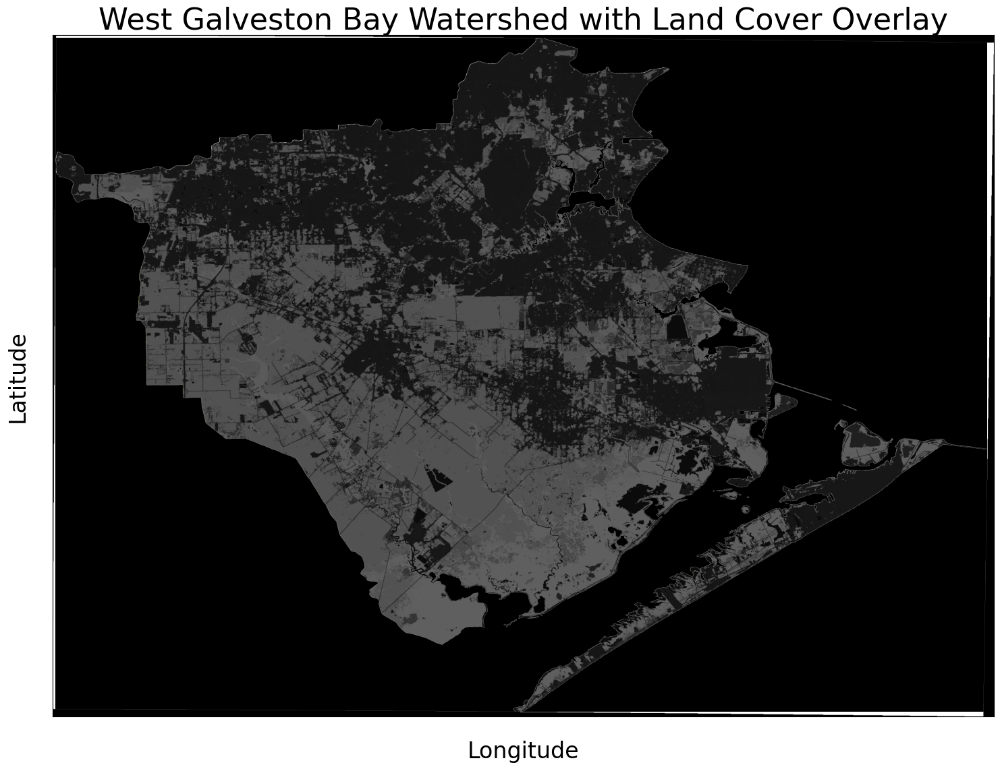

In [30]:
# Open the clipped Landsat image
with rasterio.open('WGB_Landsat8_RGB_percentile_stretch_with_a_hole.tif') as src_landsat:
    landsat_data = src_landsat.read()
    landsat_extent = [src_landsat.bounds.left, src_landsat.bounds.right, src_landsat.bounds.bottom, src_landsat.bounds.top]

# Open the NLCD raster with the alpha channel
with rasterio.open('NLCD_2019_GTX_Sample_West_Galveston_Bay_4326_alpha.tif') as src_nlcd:
    # Read the land cover data and the alpha channel separately
    nlcd_data = src_nlcd.read(1)
    alpha_channel = src_nlcd.read(2)
    nlcd_extent = [src_nlcd.bounds.left, src_nlcd.bounds.right, src_nlcd.bounds.bottom, src_nlcd.bounds.top]

    # Stack the land cover data three times to simulate an RGB image
    nlcd_rgb = np.stack((nlcd_data, nlcd_data, nlcd_data, alpha_channel), axis=0)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(18, 18))

# Display the Landsat image
ax.imshow(landsat_data[:3, :, :].transpose((1, 2, 0)), extent=landsat_extent)

# Overlay the NLCD raster with alpha channel for transparency
ax.imshow(nlcd_rgb.transpose((1, 2, 0)), extent=nlcd_extent)

# Set title and labels
ax.set_title('West Galveston Bay Watershed with Land Cover Overlay', fontsize=32)
ax.set_xlabel('Longitude', color='black', fontsize=24, labelpad=25)
ax.set_ylabel('Latitude', color='black', fontsize=24, labelpad=25)

# Remove axis ticks
ax.set_xticks([])
ax.set_yticks([])

plt.show()


<AxesSubplot:title={'center':'West Galveston Bay Watershed'}, xlabel='Longitude', ylabel='Latitude'>

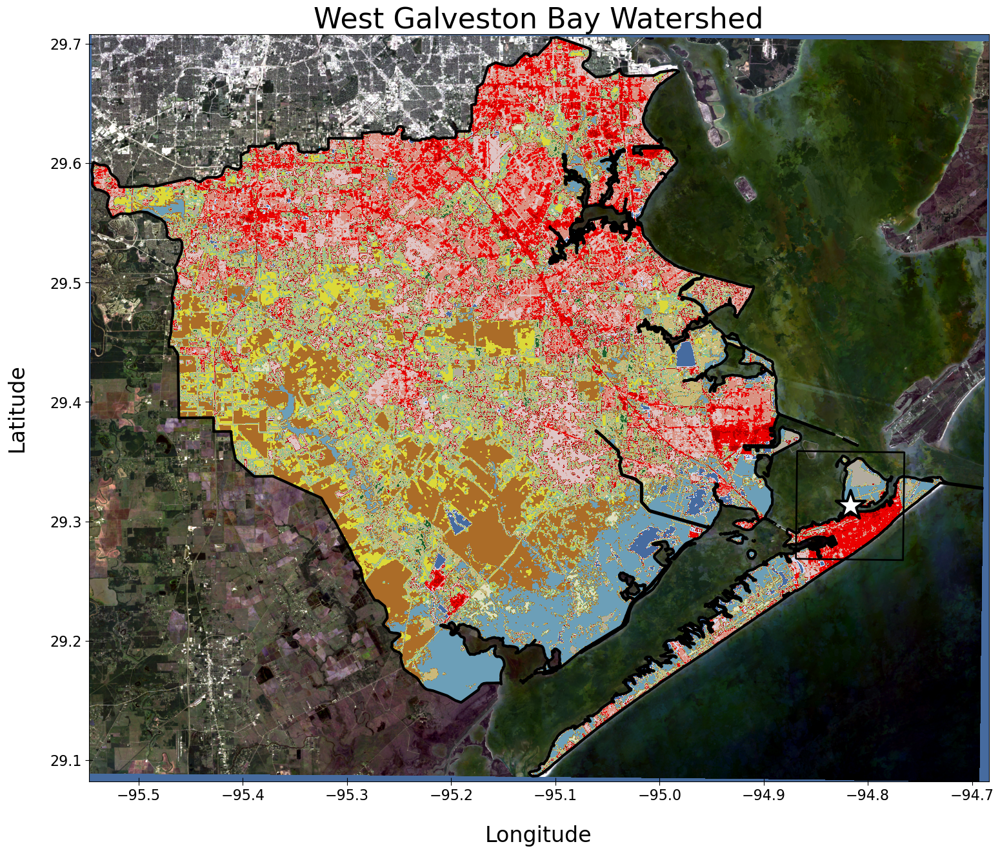

In [31]:
# Landsat 8 scaling factors and offsets
scale_factor = 0.0000275
offset = -0.2

# Convert digital numbers to reflectance
def convert_dn_to_reflectance(dn):
    return dn * scale_factor + offset

# Read the data from the raster file and apply conversion to reflectance
with rasterio.open(ls8) as src_landsat:
    landsat_profile = src_landsat.profile
    band_red_dn = src_landsat.read(1).astype('float32')
    band_green_dn = src_landsat.read(2).astype('float32')
    band_blue_dn = src_landsat.read(3).astype('float32')
    landsat_extent = [src_landsat.bounds.left, src_landsat.bounds.right, src_landsat.bounds.bottom, src_landsat.bounds.top]

# Apply conversion to reflectance
band_red_reflectance = convert_dn_to_reflectance(band_red_dn)
band_green_reflectance = convert_dn_to_reflectance(band_green_dn)
band_blue_reflectance = convert_dn_to_reflectance(band_blue_dn)

# Calculate min and max reflectance values for normalization
red_min, red_max = np.nanpercentile(band_red_reflectance, (2, 98))  # Using percentile to avoid extreme values
green_min, green_max = np.nanpercentile(band_green_reflectance, (2, 98))
blue_min, blue_max = np.nanpercentile(band_blue_reflectance, (2, 98))

# Normalize the bands
red_normalized = (band_red_reflectance - red_min) / (red_max - red_min)
green_normalized = (band_green_reflectance - green_min) / (green_max - green_min)
blue_normalized = (band_blue_reflectance - blue_min) / (blue_max - blue_min)

# Clip values to 0-1 range
red_normalized = np.clip(red_normalized, 0, 1)
green_normalized = np.clip(green_normalized, 0, 1)
blue_normalized = np.clip(blue_normalized, 0, 1)

# Combine the normalized bands
natural_color_landsat = np.dstack((red_normalized, green_normalized, blue_normalized))

# Open the original NLCD raster file
with rasterio.open("NLCD_2019_GTX_Sample_West_Galveston_Bay_4326.tif") as src:
    # Read the data
    nlcd_data = src.read(1)
    nlcd_extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    # Mask out the 'nodata' values
    masked_nlcd_data = np.ma.masked_where(nlcd_data == src.nodata, nlcd_data)

# Now let's plot the combined image with the NLCD overlay
fig, ax = plt.subplots(figsize=(18, 18))

# Display the Landsat image with normalized colors
ax.imshow(natural_color_landsat, extent=landsat_extent)

# Display the NLCD raster with the colormap and normalization applied
img = ax.imshow(masked_nlcd_data, cmap=cmap, norm=norm, extent=nlcd_extent)

# Set title and labels
ax.set_title('West Galveston Bay Watershed', fontsize=32)
ax.set_xlabel('Longitude', color='black', fontsize=24, labelpad=25)
ax.set_ylabel('Latitude', color='black', fontsize=24, labelpad=25)
ax.xaxis.set_tick_params(which='major', direction='inout', length=8, labelsize=16)
ax.yaxis.set_tick_params(which='major', direction='inout', length=8, labelsize=16)
gbsl4.plot(ax=ax, color='none', edgecolor='black', lw=3)
sample_location.plot(ax=ax, color='white', edgecolor='black', marker='*', markersize=1200, lw=3, zorder=6)
bounding_box_4326.plot(ax=ax, color='none', edgecolor='black', lw=2)



#fig.savefig("Chomiak_TX_Images_2023\2019_NLCD_GBSL_WGB_Landsat_4326.png", dpi=600, bbox_inches='tight')

In [35]:
# HydroRIVERS Texas
HydroRIVERS_TX = gpd.read_file("HydroRIVERS_Texas")
# Clip to Box for WGB n Friends
HydroRIVERS_TX_gbsl4 = HydroRIVERS_TX[HydroRIVERS_TX.within(gbsl4.unary_union)]
#HydroRIVERS_TX_gbsl4.to_file('HydroRIVERS_TX_SJRB\HydroRIVERS_TX_SJRB.shp', crs='EPSG:4326', driver = 'ESRI Shapefile')

# ORD_FLOW
flow_1 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 1]
flow_2 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 2]
flow_3 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 3]
flow_4 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 4]
flow_5 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 5]
flow_6 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 6]
flow_7 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 7]
flow_8 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 8]
flow_9 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 9]
flow_10 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 10]
flow_11 = HydroRIVERS_TX_gbsl4.loc[HydroRIVERS_TX_gbsl4['ORD_FLOW'] == 11]

print('Shapes:')
print('flow_1: ', flow_1.shape)
print('flow_2: ', flow_2.shape)
print('flow_3: ', flow_3.shape)
print('flow_4: ', flow_4.shape)
print('flow_5: ', flow_5.shape)
print('flow_6: ', flow_6.shape)
print('flow_7: ', flow_7.shape)
print('flow_8: ', flow_8.shape)
print('flow_9: ', flow_9.shape)
print('flow_10: ', flow_10.shape)
print('flow_11: ', flow_11.shape)

Shapes:
flow_1:  (0, 16)
flow_2:  (0, 16)
flow_3:  (0, 16)
flow_4:  (0, 16)
flow_5:  (0, 16)
flow_6:  (33, 16)
flow_7:  (58, 16)
flow_8:  (0, 16)
flow_9:  (0, 16)
flow_10:  (0, 16)
flow_11:  (0, 16)


In [33]:
halt

NameError: name 'halt' is not defined

C:\Users\wbcho\anaconda3\envs\geo\lib\site-packages\geopandas\plotting.py:678: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


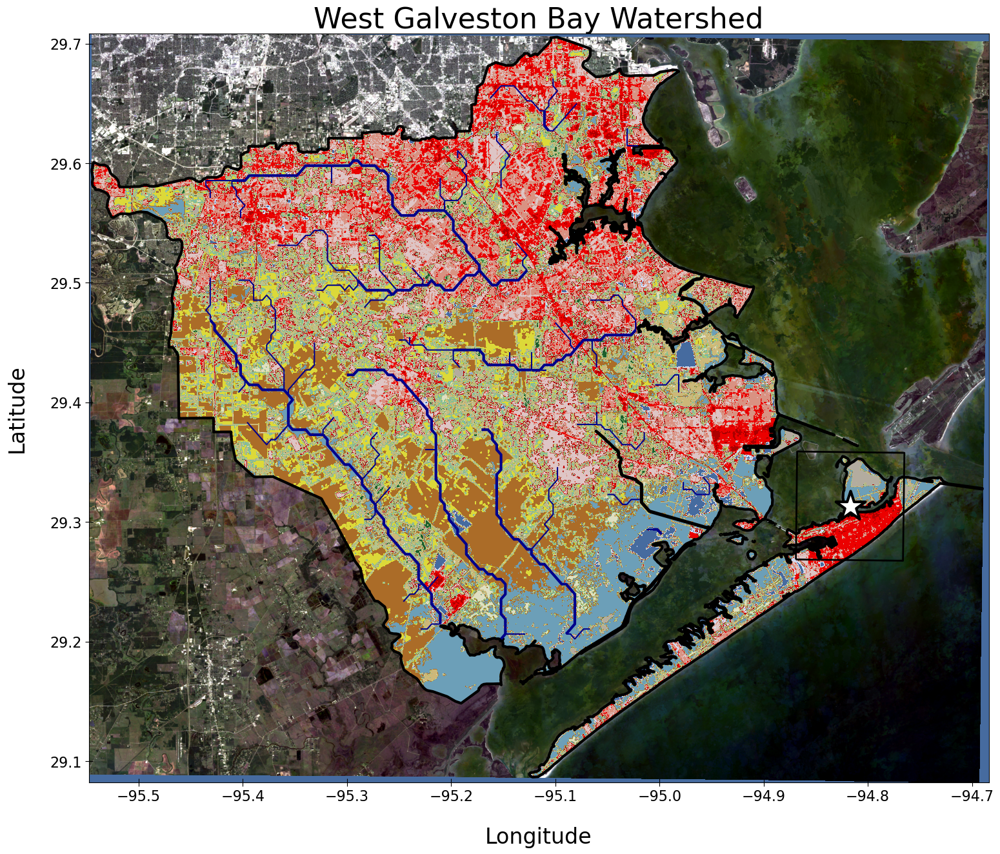

In [38]:
# Landsat 8 scaling factors and offsets
scale_factor = 0.0000275
offset = -0.2

# Convert digital numbers to reflectance
def convert_dn_to_reflectance(dn):
    return dn * scale_factor + offset

# Read the data from the raster file and apply conversion to reflectance
with rasterio.open(ls8) as src_landsat:
    landsat_profile = src_landsat.profile
    band_red_dn = src_landsat.read(1).astype('float32')
    band_green_dn = src_landsat.read(2).astype('float32')
    band_blue_dn = src_landsat.read(3).astype('float32')
    landsat_extent = [src_landsat.bounds.left, src_landsat.bounds.right, src_landsat.bounds.bottom, src_landsat.bounds.top]

# Apply conversion to reflectance
band_red_reflectance = convert_dn_to_reflectance(band_red_dn)
band_green_reflectance = convert_dn_to_reflectance(band_green_dn)
band_blue_reflectance = convert_dn_to_reflectance(band_blue_dn)

# Calculate min and max reflectance values for normalization
red_min, red_max = np.nanpercentile(band_red_reflectance, (2, 98))  # Using percentile to avoid extreme values
green_min, green_max = np.nanpercentile(band_green_reflectance, (2, 98))
blue_min, blue_max = np.nanpercentile(band_blue_reflectance, (2, 98))

# Normalize the bands
red_normalized = (band_red_reflectance - red_min) / (red_max - red_min)
green_normalized = (band_green_reflectance - green_min) / (green_max - green_min)
blue_normalized = (band_blue_reflectance - blue_min) / (blue_max - blue_min)

# Clip values to 0-1 range
red_normalized = np.clip(red_normalized, 0, 1)
green_normalized = np.clip(green_normalized, 0, 1)
blue_normalized = np.clip(blue_normalized, 0, 1)

# Combine the normalized bands
natural_color_landsat = np.dstack((red_normalized, green_normalized, blue_normalized))

# Open the original NLCD raster file
with rasterio.open("NLCD_2019_GTX_Sample_West_Galveston_Bay_4326.tif") as src:
    # Read the data
    nlcd_data = src.read(1)
    nlcd_extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    # Mask out the 'nodata' values
    masked_nlcd_data = np.ma.masked_where(nlcd_data == src.nodata, nlcd_data)

# Now let's plot the combined image with the NLCD overlay
fig, ax = plt.subplots(figsize=(18, 18))

# Display the Landsat image with normalized colors
ax.imshow(natural_color_landsat, extent=landsat_extent)

# Display the NLCD raster with the colormap and normalization applied
img = ax.imshow(masked_nlcd_data, cmap=cmap, norm=norm, extent=nlcd_extent)

# Set title and labels
ax.set_title('West Galveston Bay Watershed', fontsize=32)
ax.set_xlabel('Longitude', color='black', fontsize=24, labelpad=25)
ax.set_ylabel('Latitude', color='black', fontsize=24, labelpad=25)
ax.xaxis.set_tick_params(which='major', direction='inout', length=8, labelsize=16)
ax.yaxis.set_tick_params(which='major', direction='inout', length=8, labelsize=16)
gbsl4.plot(ax=ax, color='none', edgecolor='black', lw=3)
sample_location.plot(ax=ax, color='white', edgecolor='black', marker='*', markersize=1200, lw=3, zorder=6)
bounding_box_4326.plot(ax=ax, color='none', edgecolor='black', lw=2)
# Hydrology
#HydroRIVERS_TX_SJRB_Spring.plot(ax=ax, column='ORD_FLOW', color='darkblue', lw=4, zorder=3, label='10$^1$ - 10$^2$ [m$^3$/s]')
flow_5.plot(ax=ax, color='darkblue', lw=4.5, zorder=3, label='10$^1$ - 10$^2$ [m$^3$/s]')
flow_6.plot(ax=ax, color='darkblue', lw=3.0, zorder=4, label='10$^0$ - 10$^1$ [m$^3$/s]')
flow_7.plot(ax=ax, color='darkblue', lw=1.5, zorder=3, label='10$^{-1}$ - 10$^0$ [m$^3$/s]')



#fig.savefig("Chomiak_TX_Images_2023\2019_NLCD_GBSL_WGB_Landsat_4326_rivers.png", dpi=600, bbox_inches='tight')

In [39]:
os.getcwd()

'J:\\Chomiak_Python\\Chomiak_Notebooks\\Maps_NA_TX_Data'